# Climatology

Assessment of model monthly climatology bias over the 2000-2019 period.

(Bias corrected data for the period 2000-2019 was produced by training on data from the 1980-1999 period.)

In [11]:
import warnings
warnings.filterwarnings('ignore')

import sys
import numpy as np
import matplotlib.pyplot as plt
import cmocean
import cartopy.crs as ccrs

sys.path.append('/g/data/xv83/users/at2708/bias_adjustment/evaluation/npcp/results')
import utils

In [12]:
def calc_clim(da, var):
    """Calculate the monthly climatology"""
    if var == 'pr':
        da_monthly = da.resample(time='1M').sum()
        climatology = da_monthly.groupby('time.month').mean('time')
    else:
        climatology = da.groupby('time.month').mean(dim='time')
    
    jan = climatology.sel(month=1)
    feb = climatology.sel(month=2)
    mar = climatology.sel(month=3)
    apr = climatology.sel(month=4)
    may = climatology.sel(month=5)
    jun = climatology.sel(month=6)
    jul = climatology.sel(month=7)
    aug = climatology.sel(month=8)
    sep = climatology.sel(month=9)
    oct = climatology.sel(month=10)
    nov = climatology.sel(month=11)
    dec = climatology.sel(month=12)
    return jan,feb,mar,apr,may,jun,jul,aug,sep,oct,nov,dec   


In [13]:
def get_data(var, rcm):
    """Get data needed for the evaluation"""

    assert rcm in ['BOM-BARPA-R', 'UQ-DES-CCAM-2105']
    
    da_obs = utils.get_npcp_data(
        var,
        'observations',
        'AGCD',
        'raw',
        'task-reference',
        '2000-01-01',
        '2019-12-31',
        'AU'
    )   
    da_gcm = utils.get_npcp_data(
        var,
        'CSIRO-ACCESS-ESM1-5',
        'GCM',
        'raw',
        'task-reference',
        '2000-01-01',
        '2019-12-31',
        'AU'
    )
    da_rcm_raw = utils.get_npcp_data(
        var,
        'CSIRO-ACCESS-ESM1-5',
        rcm,
        'raw',
        'task-reference',
        '2000-01-01',
        '2019-12-31',
        'AU'
    )
    da_rcm_ecdfm = utils.get_npcp_data(
        var,
        'CSIRO-ACCESS-ESM1-5',
        rcm,
        'ecdfm',
        'task-historical',
        '2000-01-01',
        '2019-12-31',
        'AU'
    )
    # TODO: Add additional bias correction methods as data becomes available 

    return da_obs, da_gcm, da_rcm_raw, da_rcm_ecdfm

In [14]:
def plot_mean_bias(ax, da_obs, da_model, var, cmap, levels, model_name, month):
    """Plot the mean bias for a particular model"""
    
    jan_obs,feb_obs,mar_obs,apr_obs,may_obs,jun_obs,jul_obs,aug_obs,sep_obs,oct_obs,nov_obs,dec_obs  = calc_clim(da_obs, var)
    jan_mod,feb_mod,mar_mod,apr_mod,may_mod,jun_mod,jul_mod,aug_mod,sep_mod,oct_mod,nov_mod,dec_mod  = calc_clim(da_model, var)

    if month == 'jan':
        bias = jan_mod - jan_obs
    elif month == 'feb':
        bias = feb_mod - feb_obs
    elif month == 'mar':
        bias = mar_mod - mar_obs
    elif month == 'apr':
        bias = apr_mod - apr_obs
    elif month == 'may':
        bias = may_mod - may_obs
    elif month == 'jun':
        bias = jun_mod - jun_obs
    elif month == 'jul':
        bias = jul_mod - jul_obs
    elif month == 'aug':
        bias = aug_mod - aug_obs
    elif month == 'sep':
        bias = sep_mod - sep_obs
    elif month == 'oct':
        bias = oct_mod - oct_obs
    elif month == 'nov':
        bias = nov_mod - nov_obs
    elif month == 'dec':
        bias = dec_mod - dec_obs
    else:
        print('Invalid month')
        return
    
    units = 'mm/month' if var == 'pr' else da_model.attrs['units']
    
    im = bias.plot(
        ax=ax,
        transform=ccrs.PlateCarree(),
        cmap=cmap,
        levels=levels,
        extend='both', 
        add_colorbar=False
    ) #cbar_kwargs={'label': units},
    ax.set_title(model_name)
    ax.coastlines()
    cbar = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.04)
    cbar.ax.tick_params(labelsize=14)  
    cbar.set_label(units, fontsize=14) 


In [15]:
def plot_comparison(var, rcm, cmap, levels):
    """Plot the complete comparison"""

    da_obs, da_gcm, da_rcm_raw, da_rcm_ecdfm = get_data(var, rcm)

    months= ['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']
        
    rows, cols = len(months), 3  
    
    fig, axs = plt.subplots(rows, cols, figsize=[24, 6*rows], subplot_kw={'projection': ccrs.PlateCarree()})
    
    for row, month in enumerate(months):

        ax1 = axs[row, 0]
        ax2 = axs[row, 1]
        ax3 = axs[row, 2]

        # Plot GCM bias
        plot_mean_bias(ax1, da_obs, da_gcm, var, cmap, levels, 'CSIRO-ACCESS-ESM1-5', month)
        ax1.set_title(f'CSIRO-ACCESS-ESM1-5 ({month.upper()})', fontsize=16)

        # Plot RCM raw bias
        plot_mean_bias(ax2, da_obs, da_rcm_raw, var, cmap, levels, f'{rcm} (raw)', month)
        ax2.set_title(f'{rcm} (raw) ({month.upper()})', fontsize=16)

        # Plot RCM bias corrected bias
        plot_mean_bias(ax3, da_obs, da_rcm_ecdfm, var, cmap, levels, f'{rcm} (ecdfm)', month)
        ax3.set_title(f'{rcm} (ecdfm) ({month.upper()})', fontsize=16)
    
    long_name = da_rcm_raw.attrs['long_name']
    plt.suptitle(f' Monthy climatology bias (model minus obs) for different months in the 2000-2019 {long_name}', fontsize=18)
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()


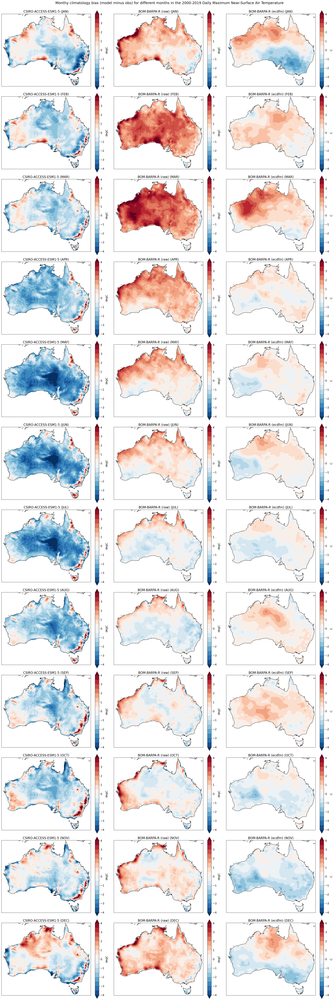

In [16]:
plot_comparison('tasmax', 'BOM-BARPA-R', 'RdBu_r', np.arange(-4, 4.01, 0.5))

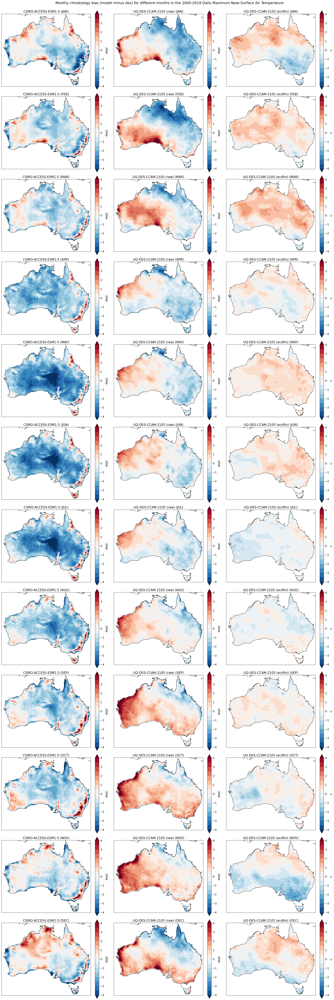

In [17]:
plot_comparison('tasmax', 'UQ-DES-CCAM-2105', 'RdBu_r', np.arange(-4, 4.01, 0.5))

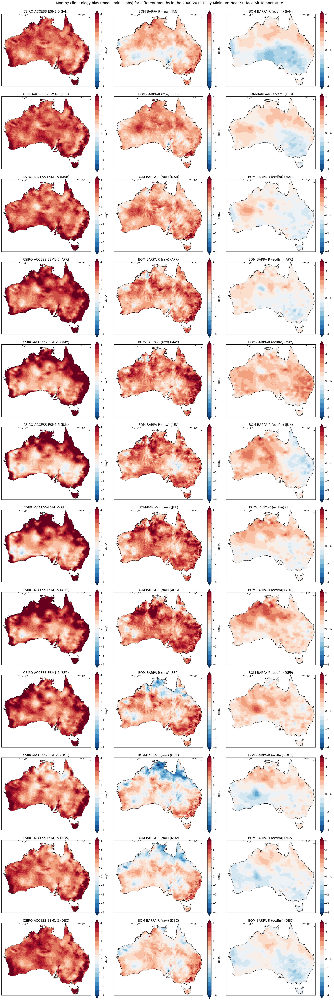

In [18]:
plot_comparison('tasmin', 'BOM-BARPA-R', 'RdBu_r', np.arange(-4, 4.01, 0.5))

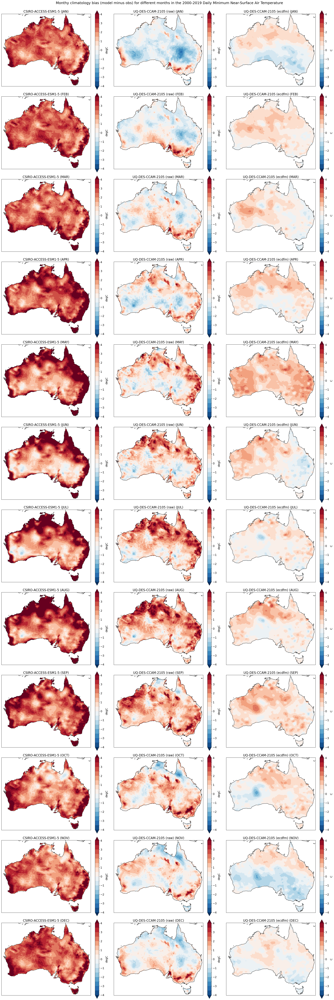

In [19]:
plot_comparison('tasmin', 'UQ-DES-CCAM-2105', 'RdBu_r', np.arange(-4, 4.01, 0.5))

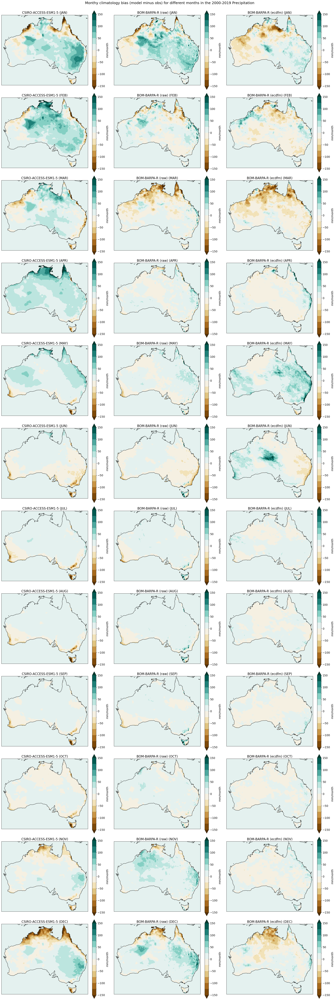

In [26]:
plot_comparison('pr', 'BOM-BARPA-R', 'BrBG', np.arange(-150, 150.1, 25))

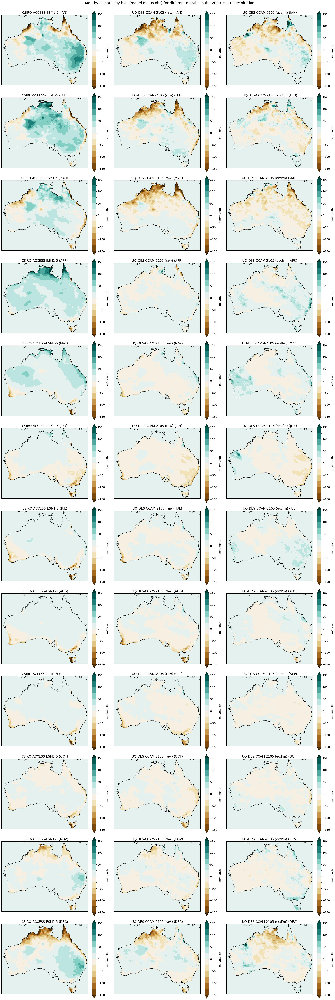

In [27]:
plot_comparison('pr', 'UQ-DES-CCAM-2105', 'BrBG', np.arange(-150, 150.1, 25))